In [122]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

# Dataset

Tiny Lego Dataset 
[Link](https://people.eecs.berkeley.edu/~bmild/nerf/tiny_nerf_data.npz)

In [123]:
if not os.path.exists("tiny_nerf_data.npz"):
  !wget https://people.eecs.berkeley.edu/~bmild/nerf/tiny_nerf_data.npz

dataset = np.load("tiny_nerf_data.npz")

print("Tiny NeRF Data")
print("list of files:", dataset.files)

# 100 X 100 크기의 106개의 이미지
# Extrinsic parameters
# Camera가 world coordinate의 기준점으로부터 얼마나 rotated 되고 translated 되었는지
print("shape of images:", dataset["images"].shape)
print("shape of poses:", dataset["poses"].shape)

# Intrinsic parameters
print("focal length:", dataset["focal"])


Tiny NeRF Data
list of files: ['images', 'poses', 'focal']
shape of images: (106, 100, 100, 3)
shape of poses: (106, 4, 4)
focal length: 138.88887889922103


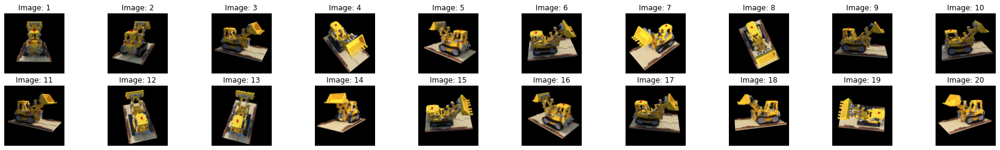

In [124]:
fig, axs = plt.subplots(nrows=2, ncols=10, figsize=(30, 4))

for idx, ax in enumerate(axs.flatten()):
  plt.sca(ax)
  plt.imshow(dataset["images"][idx])
  plt.title("Image: {}".format(idx + 1))
  plt.axis("off")

# Pinhole Camera Model

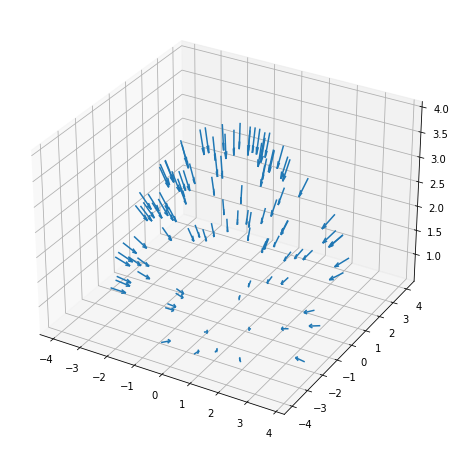

In [125]:
poses = dataset['poses']

# Camera coordinate의 z축과 camera rotation matrix를 내적하면
# Camear coordinate의 z축을 world coordinate에서의 camera rotation 방향으로 align 시킬 수 있다.
dirs = np.stack([np.sum([0, 0, -1] * pose[:3, :3], axis=-1) for pose in poses])

# Camera coordinate의 기준점이 world coordinate의 기준점으로부터 얼마나 떨어져 있는지
# Camera translation matrix에 해당되는 부분
origins = poses[:, :3, 3]

ax = plt.figure(figsize=(12, 8)).add_subplot(projection="3d")

# Quiver: 2차원 평면상에 각각의 좌표에서의 direction을 그려주는 utility 
_ = ax.quiver(
    origins[..., 0].flatten(),
    origins[..., 1].flatten(),
    origins[..., 2].flatten(),
    dirs[..., 0].flatten(),
    dirs[..., 1].flatten(),
    dirs[..., 2].flatten(),
    length=0.5,
    normalize=True
)

plt.show()

# Utilites

In [126]:
# 하나의 image에 관해 각각의 모든 픽셀을 지나는 ray의 origin과 viewing direction(pose)
def get_rays(h:int, w:int, focal_length:float, pose:torch.Tensor):
  # Pixel coordinate
  i, j = torch.meshgrid(
      torch.arange(w, dtype=torch.float32).to(pose),
      torch.arange(h, dtype=torch.float32).to(pose),
      indexing="ij"
  )

  i, j = i.transpose(-1, -2), j.transpose(-1, -2)

  # Pixel coordinate에서의 각각의 픽셀이 이미지의 중점(w와 h의 각각의 2분의 1)으로부터 얼마나 떨어져 있는지
  rays_d = torch.stack([(i - w * 0.5) / focal_length,
                        -(j - h * 0.5) / focal_length,
                        -torch.ones_like(i)
                        ], dim=-1)
  
  # Pixel별 ray의 viewing direction을
  # world coordinate에서의 camera rotation 방향으로 align 시킨다.

  # shape of rays_d: (width, height, 3) = (width, height, 1, 3) * (3, 3)
  '''
  계산 과정에서 broadcasting이 된다는 걸 고려하자.
  (width, height, 1, 3) * (3, 3) => (width, height, 3, 3) * (width, height, 3, 3)
  sum[(width, height, 3, 3), dim=-1] => (width, height, 3)
  '''
  rays_d = torch.sum(rays_d[..., np.newaxis, :] * pose[:3, :3], dim=-1)

  # shape of rays_o: (width, height, 3)
  # (3) => (width, height, 3)
  rays_o = pose[:3, -1].expand(rays_d.shape)

  return rays_o, rays_d


In [127]:
def stratified_sampling(
    rays_o, # shape of rays_o: (width, height, 3)
            # 각각의 pixel 좌표들이 실제 world coordinate 3차원상에서 어떠한 좌표를 지니는지
    rays_d, # shape of rays_d: (width, height, 3)
    near, # lower bound
    far, # upper bound
    n
):
  
  # shape of t: (num_samples)
  t = torch.linspace(near, far, n).to(rays_o)

  # shape of noise: (width, height, num_samples)
  noise_shape = list(rays_o.shape[:-1]) + [n]

  # shape of depth values: (width, height, num_samples) = (width, height, num_samples) * num_val / n + (num_samples)
  '''
  계산 과정에서 broadcasting이 된다는 걸 고려하자.
  (width, height, num_samples) + (num_samples) => (width, height, num_samples) + (width, height, num_samples)
  '''
  t = torch.rand(noise_shape).to(rays_o) * (far - near) / n + t

  # shape of x: (width, height, num_samples, 3) = (width, height, 1, 3) + (width, height, 1, 3) * (width, height, num_samples, 1)
  '''
  계산 과정에서 broadcasting이 된다는 걸 고려하자.
  (width, height, 1, 3) * (width, height, num_samples, 1) => (width, height, num_samples, 3) * (width, height, num_samples, 3)
  (width, height, 1, 3) + (width, height, num_samples, 3) => (width, height, num_samples, 3) + (width, height, num_samples, 3)
  '''
  x = rays_o[..., np.newaxis, :] + rays_d[..., np.newaxis, :] * t[..., :, np.newaxis]

  return x, t

In [128]:
def positional_encoding(x, L=6, include_input=True) -> torch.Tensor:
  
  encoding = [x] if include_input else []
  
  frequency_bands = 2.0 ** torch.linspace(
      0.0, L-1, L, dtype=x.dtype, device=x.device
  )

  for freq in frequency_bands:
    encoding.append(torch.sin(freq * np.pi * x))
    encoding.append(torch.cos(freq * np.pi * x))

  return torch.cat(encoding, dim=-1)

## Volume Rendering

![volume rendering 1](https://img1.daumcdn.net/thumb/R1280x0/?scode=mtistory2&fname=https%3A%2F%2Fblog.kakaocdn.net%2Fdn%2FbFBwIw%2FbtrXIjH6hFl%2FfZSfGrwbZGAYBHqnb40J91%2Fimg.jpg)


![volume rendering 2](https://img1.daumcdn.net/thumb/R1280x0/?scode=mtistory2&fname=https%3A%2F%2Fblog.kakaocdn.net%2Fdn%2Fbu2QAn%2FbtrXHIBmTxw%2FYy9WOJf3EhVQyKXblRpFk1%2Fimg.jpg)


![volume rendering 3](https://img1.daumcdn.net/thumb/R1280x0/?scode=mtistory2&fname=https%3A%2F%2Fblog.kakaocdn.net%2Fdn%2FpZLjV%2FbtrXHPtYIBd%2FmxNvNSOXgHbBbC88OkPQsK%2Fimg.png)

In [129]:
def volume_rendering(c, sigma, rays_o, t):
  '''
  shape of t: (width, height, num_samples)
  shape of c: (width, height, num_samples, 3)
  shape of sigma: (width, height, num_samples, 1)
  '''
  sigma = torch.nn.functional.relu(sigma)[..., 0]
  c = torch.sigmoid(c)

  # 인접한 point끼리의 depth value(거리) 차이
  # shape of delta: (width, height, num_samples - 1)
  delta = t[..., 1:] - t[..., :-1]
  
  # 마지막 point에서 ray가 종료되었음을 알리기 위해 infinite를 추가한다.
  # shape of delta: (width, height, num_samples)
  delta = torch.cat([delta,
                     torch.tensor([1e10], dtype=rays_o.dtype, device=rays_o.device).expand(t[..., :1].shape)
                     ], dim=-1)
  
  alpha = 1. - torch.exp(-sigma * delta)
  T = torch.cumprod(1. - alpha + 1e-10, -1)

  # i번째 T는 i-1번째까지의 sample point 값들에 관해 누적하여 계산한 것이므로 한 칸을 민다.
  T = torch.roll(T, 1, -1)
  T[..., 0] = 1.

  # shape of weight: (width, height, num_samples)
  weight = T * alpha
  
  # shape of rgb: (width, height, 3) = sum[(width, height, num_samples, 1) * (width, height, num_samples, 3), dim=-2]
  rgb = (weight[..., np.newaxis] * c).sum(dim=-2)
  return rgb

# Multi-resolution Hash Encoding

여러 해상도의 hash entry에 관하여 한 voxel을 감싸는 8개의 좌표에 관한 hash entry에 관해 linear interpolation을 수행한 결과를 모든 resolution에 대해 concatenation 하여 neural network의 input으로 넣는 encoding 방법이다.

각 좌표별로 어떠한 hash entry에 대응되는지는 본 논문의 equation (4)를 구현한 `hash` method에 의해 구해진다.

In [130]:
# shape of BOX_OFFSETS: (1, 8, 3)
BOX_OFFSETS = torch.tensor([[[i,j,k] for  i in [0, 1] for j in [0, 1] for k in [0, 1]]], device='cuda')

def hash(coords, log_T):
  # coords: x_i
  # pi_i: 임의로 지정할 수 있는 큰 소수
  # 최대 7개의 차원으로 들어올 수 있다고 가정한다.
  primes = [1, 2654435761, 805459861, 3674653429, 2097192037, 1434869437, 2165219737]

  xor_result = torch.zeros_like(coords)[..., 0]
  for i in range(coords.shape[-1]):
    xor_result ^= coords[..., i] * primes[i]
  
  # xor_result % (1 << logT)와 동일한 연산
  # 단지 bitwise 연산으로 작성한 것
  return torch.tensor((1<<log_T) - 1).to(xor_result.device) & xor_result


In [131]:
def get_voxel_vertices(xyz, bounding_box, resolution, log_T):
  box_min, box_max = bounding_box

  if not torch.all(xyz >= box_min) or not torch.all(xyz <= box_max):
    xyz = torch.clamp(xyz, min=box_min ,max=box_max)

  grid_size = (box_max - box_min) / resolution

  bottom_left_idx = torch.floor((xyz - box_min) / grid_size).int()
  voxel_min_vertex = bottom_left_idx * grid_size + box_min
  voxel_max_vertex = voxel_min_vertex + torch.tensor([1.0, 1.0, 1.0]).to(xyz) * grid_size
  
  # shape of voxel_indices: (B, 8, 3) = (B, 1, 3) + (B, 8, 3)
  # 여기서 B는 batch
  voxel_indices = bottom_left_idx.unsqueeze(1) + BOX_OFFSETS
  hashed_voxel_indicies = hash(voxel_indices, log_T)

  return voxel_min_vertex, voxel_max_vertex, hashed_voxel_indicies

In [132]:
class HashEmbedder(torch.nn.Module):
  def __init__(self, bounding_box, 
               n_levels=16, # multi-resolution hash table을 몇 개의 level로 구성할지
               n_features_per_level=2, # 각 feature의 dimension
               log2_hashmap_size=19, # level별 maximum hash entry 수
               base_resolution=16, # 최소 resolution
               finest_resolution=512 # 최대 resolution
              ):
    super(HashEmbedder, self).__init__()

    self.bounding_box = bounding_box
    self.n_levels = n_levels
    self.n_features_per_level = n_features_per_level
    self.log2_hashmap_size = log2_hashmap_size
    self.base_resolution = torch.tensor(base_resolution)
    self.finest_resolution = torch.tensor(finest_resolution)
    self.out_dim = self.n_levels * self.n_features_per_level

    # 논문에서 서술한 equation (3)을 통해 이미지의 scaling 값인 b를 키워 나간다.
    self.b = torch.exp((torch.log(self.finest_resolution) - torch.log(self.base_resolution))/(n_levels - 1))

    # 각 level별 hash entry를 학습하려는 파라미터로 정의한다.
    self.embeddings = nn.ModuleList([
        nn.Embedding(2**self.log2_hashmap_size, self.n_features_per_level) for i in range(n_levels)
      ])
    
    # 각 level별 파라미터를 uniform distribution으로 초기화
    for i in range(n_levels):
      nn.init.uniform_(self.embeddings[i].weight, a=-0.0001, b=0.0001)

  def trilinear_interp(self, x, voxel_min_vertex, voxel_max_vertex, voxel_embedds):
    '''
    B: batch
    shape of x: (B, 3)
    shape of voxel_min_vertex: (B, 3)
    shape of voxel_max_vertex: (B, 3)
    voxel_embedds: (B, 8, 2)
    '''
    
    # 거리가 먼 vertex에 관한 가중치는 낮게, 가까운 vertex에 관한 가중치는 높게
    # shape of weights: (B, 3)
    weights = (x - voxel_min_vertex) / (voxel_max_vertex - voxel_min_vertex)
    
    # x 방향에 관한 linear interpolation
    # shape of c00: (B, 2) = (B, 2) * (B, 1)
    c00 = voxel_embedds[:,0]*(1 - weights[:,0][:,np.newaxis]) + voxel_embedds[:,4]*weights[:,0][:,np.newaxis]
    c01 = voxel_embedds[:,1]*(1 - weights[:,0][:,np.newaxis]) + voxel_embedds[:,5]*weights[:,0][:,np.newaxis]
    c10 = voxel_embedds[:,2]*(1 - weights[:,0][:,np.newaxis]) + voxel_embedds[:,6]*weights[:,0][:,np.newaxis]
    c11 = voxel_embedds[:,3]*(1 - weights[:,0][:,np.newaxis]) + voxel_embedds[:,7]*weights[:,0][:,np.newaxis]

    # y 방향에 관한 linear interpolation
    c0 = c00*(1 - weights[:,1][:,np.newaxis]) + c10*weights[:,1][:,np.newaxis]
    c1 = c10*(1 - weights[:,1][:,np.newaxis]) + c11*weights[:,1][:,np.newaxis]

    # z 방향에 관한 linear interpolation
    c = c0*(1 - weights[:,2][:,np.newaxis]) + c1*weights[:,2][:,np.newaxis]

    # shape of c: (B, 2)
    return c


  def forward(self, x):
    x_embedded_all = []

    for i in range(self.n_levels):
      resolution = torch.floor(self.base_resolution * self.b**i)
      voxel_min_vertex, voxel_max_vertex, hashed_voxel_indices = get_voxel_vertices(
          x, self.bounding_box, resolution, self.log2_hashmap_size)
      

      voxel_embedds = self.embeddings[i](hashed_voxel_indices)
      x_embedded = self.trilinear_interp(x, voxel_min_vertex, voxel_max_vertex, voxel_embedds)
      x_embedded_all.append(x_embedded)

    return torch.cat(x_embedded_all, dim=-1)

In [133]:
# Viewing direction에 관한 encoder
# 시점에 따라 달라지는 색을 표현하기 위해 구 위에서의 좌표를 표현하는 spherical harmonics 사용
class SHEncoder(nn.Module):
    def __init__(self, input_dim=3, degree=4):
      super().__init__()

      self.input_dim = input_dim
      self.degree = degree

      assert self.input_dim == 3
      assert self.degree >= 1 and self.degree <= 5

      self.out_dim = degree**2

      self.C0 = 0.28209479177387814
      self.C1 = 0.4886025119029199
      self.C2 = [
          1.0925484305920792,
          -1.0925484305920792,
          0.31539156525252005,
          -1.0925484305920792,
          0.5462742152960396
      ]
      self.C3 = [
          -0.5900435899266435,
          2.890611442640554,
          -0.4570457994644658,
          0.3731763325901154,
          -0.4570457994644658,
          1.445305721320277,
          -0.5900435899266435
      ]
      self.C4 = [
          2.5033429417967046,
          -1.7701307697799304,
          0.9461746957575601,
          -0.6690465435572892,
          0.10578554691520431,
          -0.6690465435572892,
          0.47308734787878004,
          -1.7701307697799304,
          0.6258357354491761
      ]

    # input: 각 ray의 direction vector
    # high-dimensional feature로 encoding 하는 함수
    def forward(self, input, **kwargs):
      result = torch.empty((*input.shape[:-1], self.out_dim), dtype=input.dtype, device=input.device)
      x, y, z = input.unbind(-1)

      result[..., 0] = self.C0
      if self.degree > 1:
          result[..., 1] = -self.C1 * y
          result[..., 2] = self.C1 * z
          result[..., 3] = -self.C1 * x
          if self.degree > 2:
              xx, yy, zz = x * x, y * y, z * z
              xy, yz, xz = x * y, y * z, x * z
              result[..., 4] = self.C2[0] * xy
              result[..., 5] = self.C2[1] * yz
              result[..., 6] = self.C2[2] * (2.0 * zz - xx - yy)
              #result[..., 6] = self.C2[2] * (3.0 * zz - 1) # xx + yy + zz == 1, but this will lead to different backward gradients, interesting...
              result[..., 7] = self.C2[3] * xz
              result[..., 8] = self.C2[4] * (xx - yy)
              if self.degree > 3:
                  result[..., 9] = self.C3[0] * y * (3 * xx - yy)
                  result[..., 10] = self.C3[1] * xy * z
                  result[..., 11] = self.C3[2] * y * (4 * zz - xx - yy)
                  result[..., 12] = self.C3[3] * z * (2 * zz - 3 * xx - 3 * yy)
                  result[..., 13] = self.C3[4] * x * (4 * zz - xx - yy)
                  result[..., 14] = self.C3[5] * z * (xx - yy)
                  result[..., 15] = self.C3[6] * x * (xx - 3 * yy)
                  if self.degree > 4:
                      result[..., 16] = self.C4[0] * xy * (xx - yy)
                      result[..., 17] = self.C4[1] * yz * (3 * xx - yy)
                      result[..., 18] = self.C4[2] * xy * (7 * zz - 1)
                      result[..., 19] = self.C4[3] * yz * (7 * zz - 3)
                      result[..., 20] = self.C4[4] * (zz * (35 * zz - 30) + 3)
                      result[..., 21] = self.C4[5] * xz * (7 * zz - 3)
                      result[..., 22] = self.C4[6] * (xx - yy) * (7 * zz - 1)
                      result[..., 23] = self.C4[7] * xz * (xx - 3 * yy)
                      result[..., 24] = self.C4[8] * (xx * (xx - 3 * yy) - yy * (3 * xx - yy))

      return result

# Model

아래 그림은 NeRF의 모식도이지만, Instant NGP에서는 더 빠른 연산으로 수행하기 위해 density 예측 layer를 2개, color 예측 layer를 3개로 구성했다.

![NeRF](https://img1.daumcdn.net/thumb/R1280x0/?scode=mtistory2&fname=https%3A%2F%2Fblog.kakaocdn.net%2Fdn%2FbVRyDn%2FbtrXCH4LXLN%2Fg04M7gNMjbPMMtwtMPymCk%2Fimg.png)

In [134]:
class NeRF(torch.nn.Module):
  '''
  x의 dimension이 어떻게 60일 수 있는지?
  x는 3차원 데이터이지만, 앞서 정의한 positional encoding에 의해 sin, cos에서 L개의 각기 다른 주파수를 지니므로 3 * 2 * L에 의해 결정된 차원이다.
  여기서는 x에 대한 L을 10으로 처리한 것
  '''
  def __init__(self, gamma_x_dim=60, gamma_d_dim=24, num_channels=256, num_layers=8, skip=4):
    super(NeRF, self).__init__()

    self.layers = []
    self.skip = skip

    # 첫 8개의 MLP layer
    for i in range(num_layers):
      if not i == self.skip:
        if i == 0:
          self.layers.append(torch.nn.Linear(gamma_x_dim, num_channels))
        else:
          self.layers.append(torch.nn.Linear(num_channels, num_channels))
      else:
        self.layers.append(torch.nn.Linear(num_channels + gamma_x_dim, num_channels))

    self.layers = torch.nn.ModuleList(self.layers)
    self.sigma_out = torch.nn.Linear(num_channels, 1)

    self.feature = torch.nn.Linear(num_channels, num_channels)
    self.branch = torch.nn.Linear(num_channels + gamma_d_dim, num_channels // 2)
    self.rgb_out = torch.nn.Linear(num_channels // 2, 3)

    self.relu = torch.nn.functional.relu

  def forward(self, x, d):
    out = x

    for i, l in enumerate(self.layers):
      if not i == self.skip:
        out = self.relu(self.layers[i](out))
      else:
        out = torch.cat([out, x], dim=-1)
        out = self.relu(self.layers[i](out))

    sigma = self.sigma_out(out)

    out = self.feature(out)
    out = torch.cat([out, d], dim=-1)
    out = self.relu(self.branch(out))
    color = self.rgb_out(out)

    return color, sigma

In [135]:
class InstantNeRF(torch.nn.Module):
  def __init__(self, num_density_layers=2, num_color_layers=3, hidden_dim_density=64, hidden_dim_color=64, input_x_dim=3, input_d_dim=3, feature_dim=15):
    super(InstantNeRF, self).__init__()

    self.input_x_dim = input_x_dim
    self.input_d_dim = input_d_dim
    self.num_density_layers = num_density_layers
    self.num_color_layers = num_color_layers
    self.feature_dim = feature_dim
    self.hidden_dim_density = hidden_dim_density
    self.hidden_dim_color = hidden_dim_color

    sigma_net = []

    for i in range(self.num_density_layers):
      if i == 0:
        in_dim = self.input_x_dim
      else:
        in_dim = self.hidden_dim_density
      
      # 16 차원의 feature 중 앞의 1차원은 density로 도출하고, 나머지는 color 예측 layer의 입력으로 준다.
      if i == self.num_density_layers - 1:
        out_dim = self.feature_dim + 1
      else:
        out_dim = self.hidden_dim_density

      sigma_net.append(torch.nn.Linear(in_dim, out_dim, bias=False))

    self.sigma_net = nn.ModuleList(sigma_net)


    color_net = []

    for i in range(self.num_color_layers):
      if i == 0:
        in_dim = self.feature_dim + self.input_d_dim
      else:
        in_dim = self.hidden_dim_color

      if i == self.num_color_layers - 1:
        out_dim = 3
      else:
        out_dim = self.hidden_dim_color

      color_net.append(torch.nn.Linear(in_dim, out_dim, bias=False))

    self.color_net = nn.ModuleList(color_net)

  def forward(self, x):
    input_x, input_d = torch.split(x, [self.input_x_dim, self.input_d_dim], dim=-1)

    h = input_x

    for i in range(self.num_density_layers):
      h = self.sigma_net[i](h)
      if not i == self.num_density_layers - 1:
        h = F.relu(h, inplace=False)
    
    sigma, geo_feat = h[..., 0], h[..., 1:]

    h = torch.cat([input_d, geo_feat], dim=-1)

    for i in range(self.num_color_layers):
      h = self.color_net[i](h)
      if not i == self.num_color_layers - 1:
        h = F.relu(h, inplace=False)

    color = h

    outputs = torch.cat([color, sigma.unsqueeze(dim=-1)], dim=-1)
    return outputs

In [136]:
# 모든 camera pose들을 둘러싸는 bounding box 구하기
def get_bbox3d(focal, poses, H, W, near=2.0, far=6.0):
  min_bound = [100, 100, 100]
  max_bound = [-100, -100, -100]

  def find_min_max(pt):
    for i in range(3):
      if min_bound[i] > pt[i]:
        min_bound[i] = pt[i]
      if max_bound[i] < pt[i]:
        max_bound[i] = pt[i]
    return

  for pose in poses:
    rays_o, rays_d = get_rays(H, W, focal, pose)
    rays_o, rays_d = rays_o.reshape(-1, 3), rays_d.reshape(-1, 3)

    for i in [0, W-1, H*W-W, H*W-1]:
      min_point = rays_o[i] + near * rays_d[i]
      max_point = rays_o[i] + far * rays_d[i]
      find_min_max(min_point)
      find_min_max(max_point)

  return ((torch.tensor(min_bound) - torch.tensor([1.0, 1.0, 1.0])).to(poses), (torch.tensor(max_bound) + torch.tensor([1.0, 1.0, 1.0])).to(poses))

# Training

In [137]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

images = dataset['images']
poses = dataset['poses']
focal_length = dataset['focal']

num_images, h, w = images.shape[:3]

test_idx = 101
test_image = images[test_idx]
test_pose = poses[test_idx]

images = torch.from_numpy(images[:100, ..., :3]).to(device)
poses = torch.from_numpy(poses).to(device)
focal_length = torch.from_numpy(focal_length).to(device)

In [138]:
N_c = 32

lr = 5e-4
num_iters = 10000
num_channels = 128
num_layers = 8
skip = 4

display_every = 100

near = 2.
far = 6.

batch_size = 4 * 1024

log2_hashmap_size = 19
finest_res = 512

input_include = False

In [139]:
def train_step(h, w, focal_length, pose, near, far, n_c, embed_fn, embeddir_fn):

  rays_o, rays_d = get_rays(h, w, focal_length, pose)

  x, t = stratified_sampling(rays_o, rays_d, near, far, n_c)

  # (width, height, n_c, 3) => (width * height * n_c, 3)
  x_flatten = x.reshape(-1, 3)

  '''
  shape of rays_d: (width, height, 3)
  shape of d_flatten: (width * height * n_c, 3)
  (width, height, 1, 3) => (width, height, n_c, 3) => (width * height * n_c, 3)
  '''
  d_flatten = rays_d[..., np.newaxis, :].expand_as(x).reshape(-1, 3)

  # Encode inputs by embedding functions
  gamma_x = embed_fn(x_flatten)
  gamma_d = embeddir_fn(d_flatten)
  embedded = torch.cat([gamma_x, gamma_d], dim=-1)

  pred = []

  # Input을 모델에 한꺼번에 너무 많이 넣으면 메모리를 초과할 수 있으므로 batch 단위로 학습
  for i in range(0, embedded.shape[0], batch_size):
    pred.append(model(embedded[i:i+batch_size]))
  
  pred = torch.concat(pred, dim=0).reshape(h, w, -1, 4)
  
  colors = pred[..., :3]
  sigma = pred[..., 3].reshape(h, w, -1, 1)

  rgb = volume_rendering(colors, sigma, rays_o, t)
  return rgb

  0%|          | 0/10000 [00:00<?, ?it/s, loss=0.111]

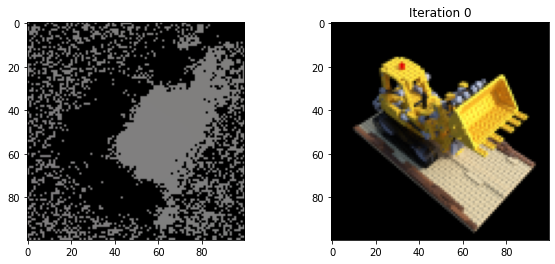

  1%|          | 100/10000 [00:22<35:07,  4.70it/s, loss=0.073] 

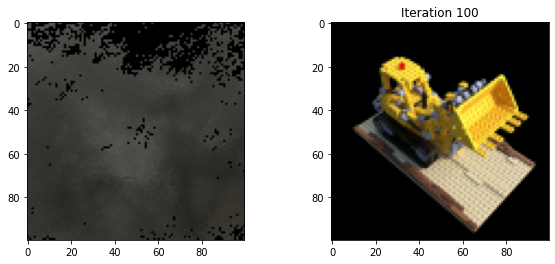

  2%|▏         | 200/10000 [00:44<35:24,  4.61it/s, loss=0.0519]

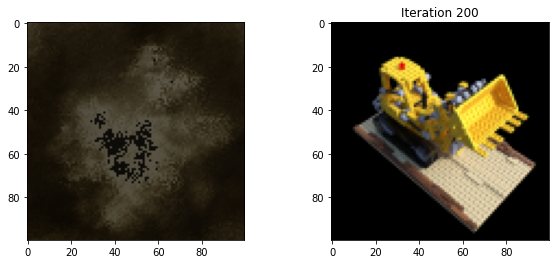

  3%|▎         | 300/10000 [01:06<35:04,  4.61it/s, loss=0.0471]

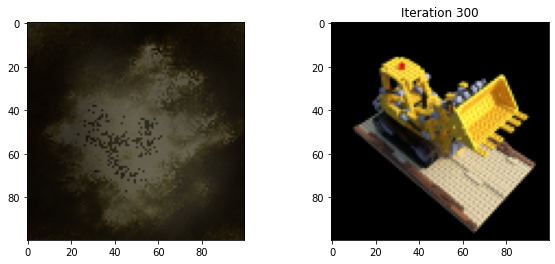

  4%|▍         | 400/10000 [01:29<34:50,  4.59it/s, loss=0.0151]

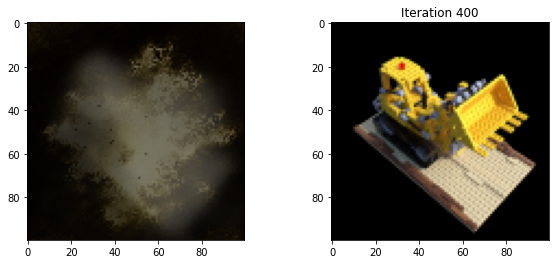

  5%|▌         | 500/10000 [01:51<34:32,  4.58it/s, loss=0.0171]

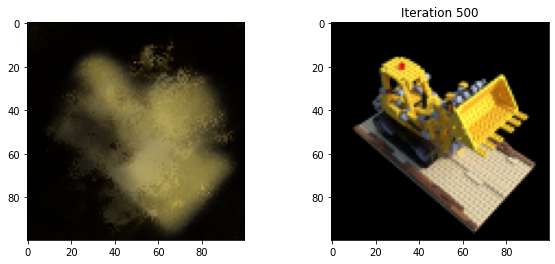

  6%|▌         | 600/10000 [02:14<34:11,  4.58it/s, loss=0.0191] 

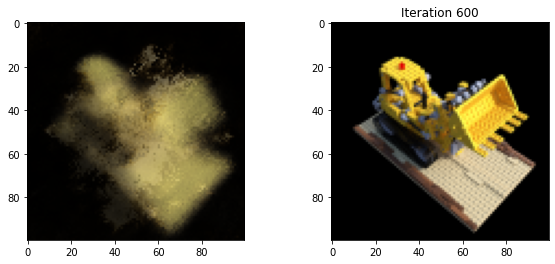

  7%|▋         | 700/10000 [02:36<33:56,  4.57it/s, loss=0.0101]

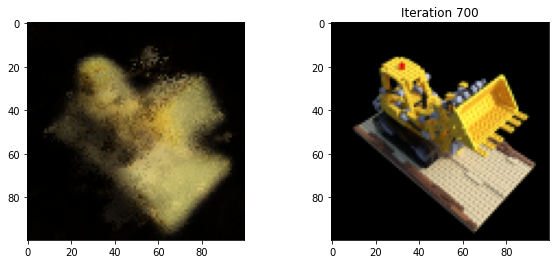

  8%|▊         | 800/10000 [02:58<33:23,  4.59it/s, loss=0.0158]

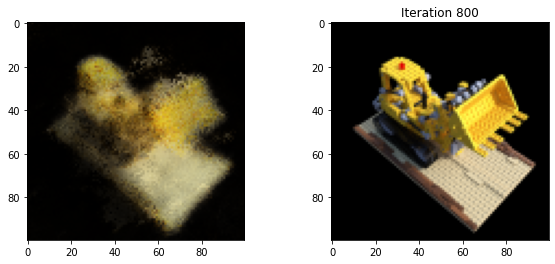

  9%|▉         | 900/10000 [03:21<34:03,  4.45it/s, loss=0.0115] 

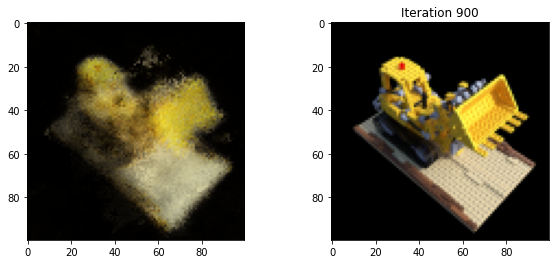

 10%|█         | 1000/10000 [03:43<34:21,  4.37it/s, loss=0.01]  

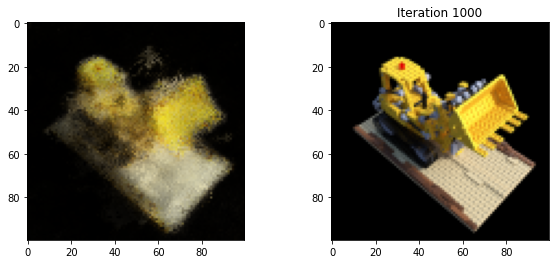

 11%|█         | 1100/10000 [04:06<33:27,  4.43it/s, loss=0.00787]

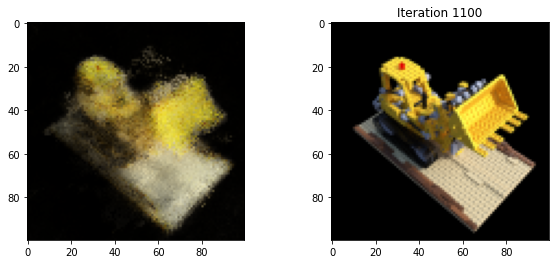

 12%|█▏        | 1200/10000 [04:28<32:07,  4.57it/s, loss=0.00749]

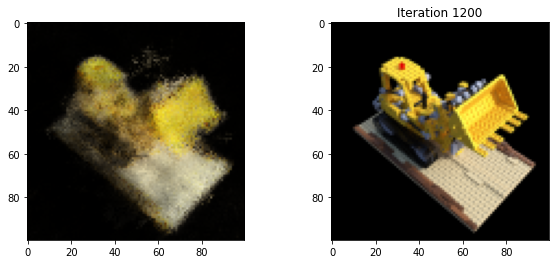

 13%|█▎        | 1300/10000 [04:51<31:48,  4.56it/s, loss=0.0071] 

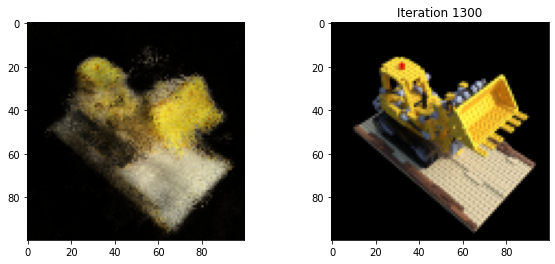

 14%|█▍        | 1400/10000 [05:13<31:14,  4.59it/s, loss=0.00564]

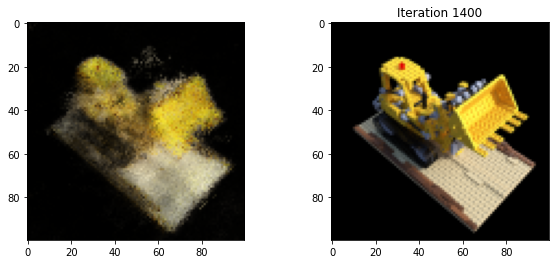

 15%|█▌        | 1500/10000 [05:35<30:56,  4.58it/s, loss=0.0084] 

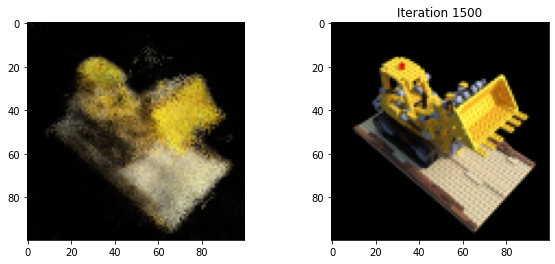

 16%|█▌        | 1600/10000 [05:58<30:26,  4.60it/s, loss=0.00288]

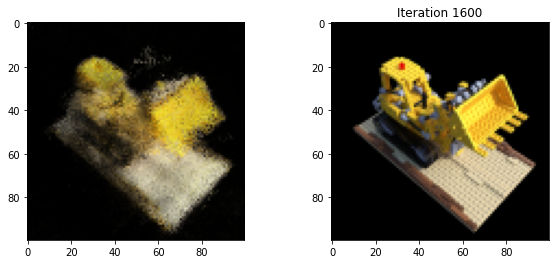

 17%|█▋        | 1700/10000 [06:20<30:06,  4.60it/s, loss=0.00637]

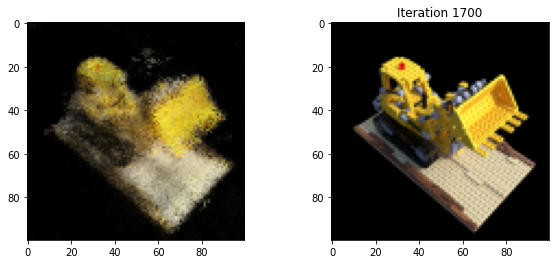

 18%|█▊        | 1800/10000 [06:43<30:04,  4.54it/s, loss=0.00669]

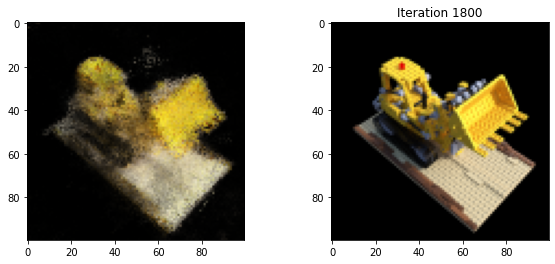

 19%|█▉        | 1900/10000 [07:05<29:13,  4.62it/s, loss=0.00684]

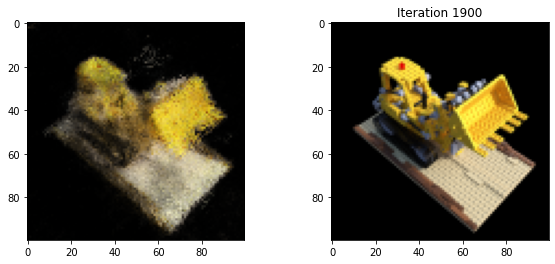

 20%|██        | 2000/10000 [07:28<29:07,  4.58it/s, loss=0.00844]

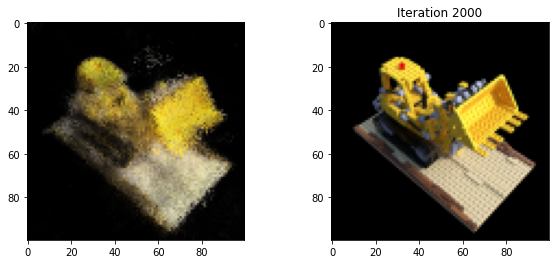

 21%|██        | 2100/10000 [07:50<28:59,  4.54it/s, loss=0.0048] 

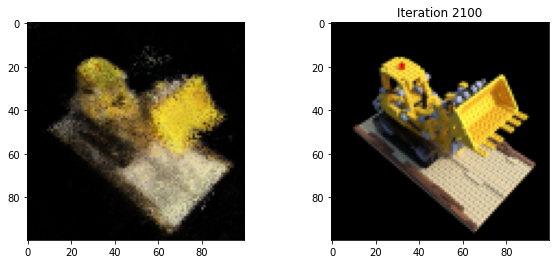

 22%|██▏       | 2200/10000 [08:13<28:14,  4.60it/s, loss=0.00547]

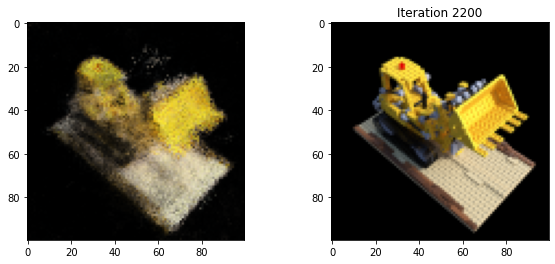

 23%|██▎       | 2300/10000 [08:35<28:30,  4.50it/s, loss=0.00752]

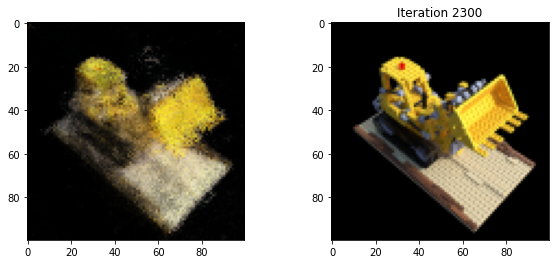

 24%|██▍       | 2400/10000 [08:58<29:52,  4.24it/s, loss=0.00485]

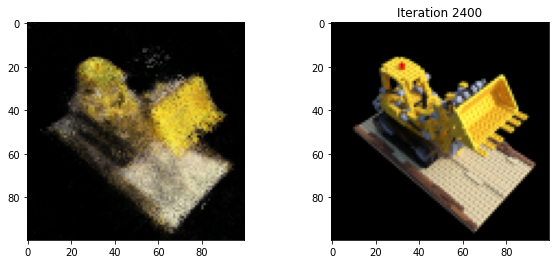

 25%|██▌       | 2500/10000 [09:20<28:29,  4.39it/s, loss=0.00543]

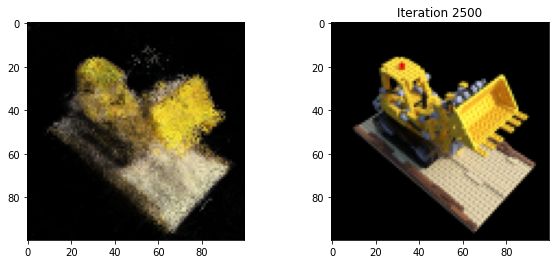

 26%|██▌       | 2600/10000 [09:42<26:48,  4.60it/s, loss=0.00341]

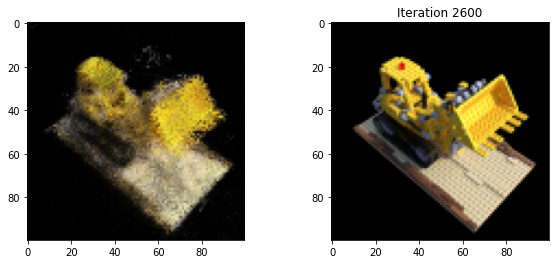

 27%|██▋       | 2700/10000 [10:05<26:36,  4.57it/s, loss=0.00624]

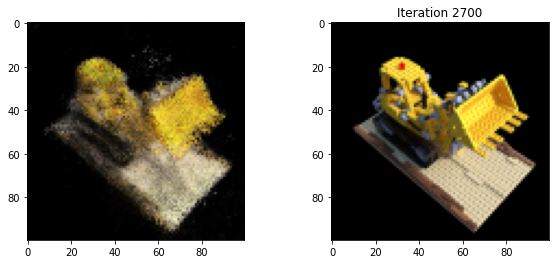

 28%|██▊       | 2800/10000 [10:27<26:13,  4.58it/s, loss=0.00645]

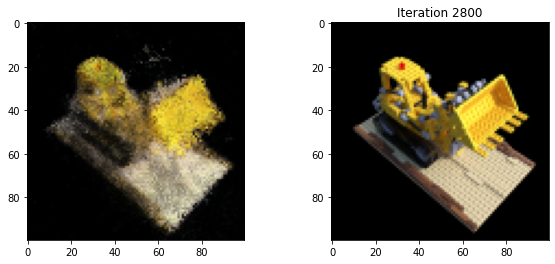

 29%|██▉       | 2900/10000 [10:50<25:54,  4.57it/s, loss=0.00505]

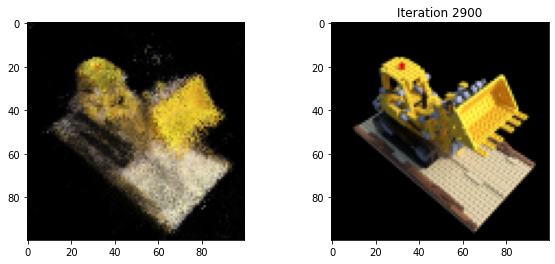

 30%|███       | 3000/10000 [11:12<25:16,  4.62it/s, loss=0.00509]

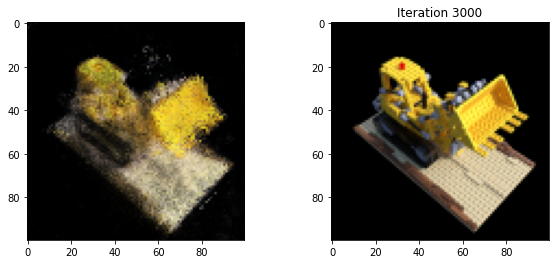

 31%|███       | 3100/10000 [11:35<28:04,  4.10it/s, loss=0.00361]

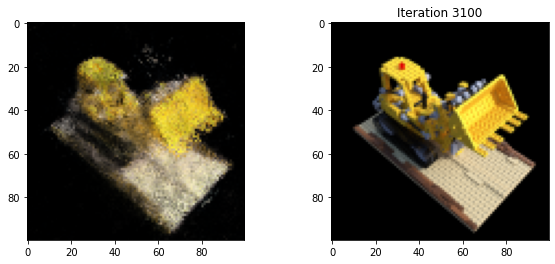

 32%|███▏      | 3200/10000 [11:58<24:28,  4.63it/s, loss=0.00555]

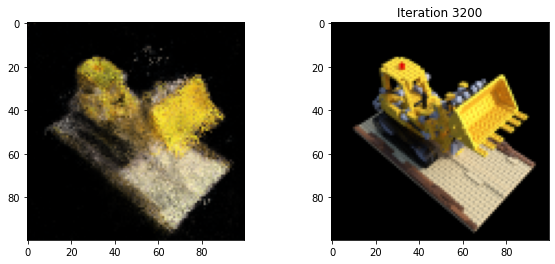

 33%|███▎      | 3300/10000 [12:20<24:08,  4.63it/s, loss=0.00328]

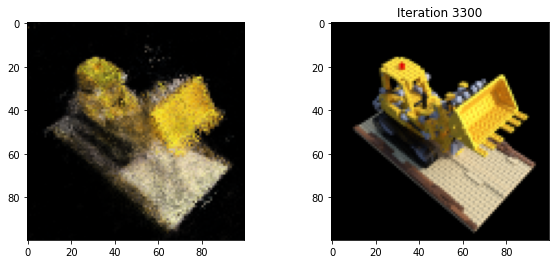

 34%|███▍      | 3400/10000 [12:43<23:42,  4.64it/s, loss=0.00314]

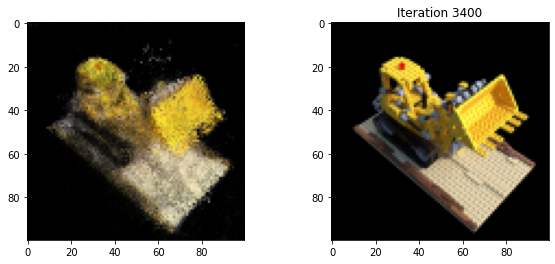

 35%|███▌      | 3500/10000 [13:05<23:49,  4.55it/s, loss=0.0047] 

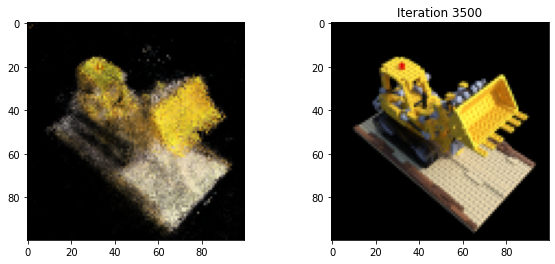

 36%|███▌      | 3600/10000 [13:28<24:15,  4.40it/s, loss=0.00403]

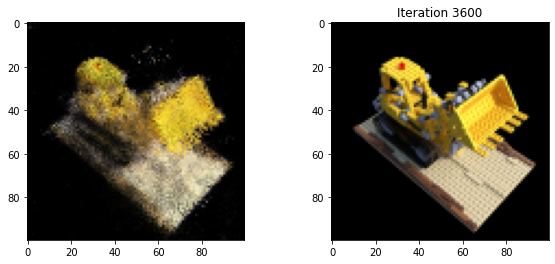

 37%|███▋      | 3700/10000 [13:51<24:42,  4.25it/s, loss=0.00624]

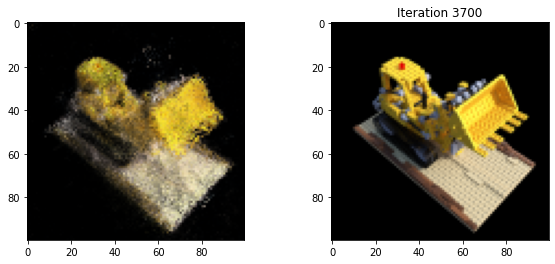

 38%|███▊      | 3800/10000 [14:13<24:11,  4.27it/s, loss=0.00278]

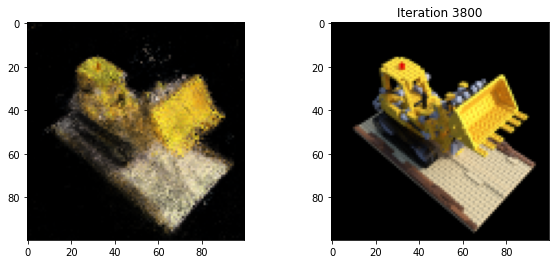

 39%|███▉      | 3900/10000 [14:36<22:21,  4.55it/s, loss=0.00558]

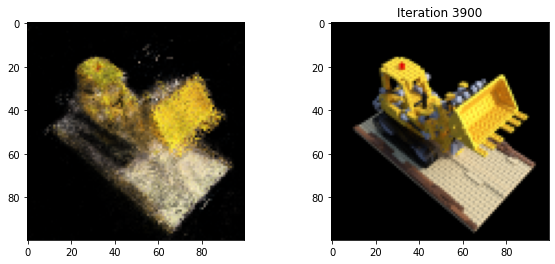

 40%|████      | 4000/10000 [14:58<22:22,  4.47it/s, loss=0.00483]

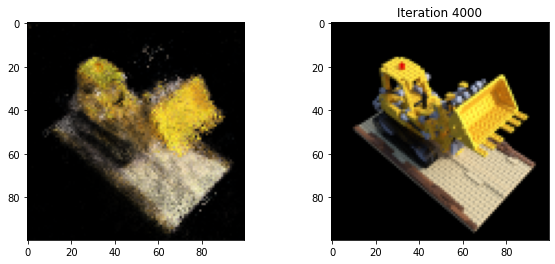

 41%|████      | 4100/10000 [15:21<21:32,  4.57it/s, loss=0.00279]

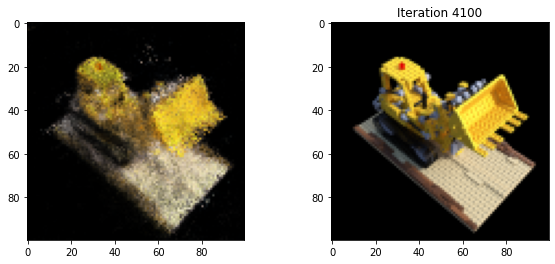

 42%|████▏     | 4200/10000 [15:44<21:25,  4.51it/s, loss=0.00382]

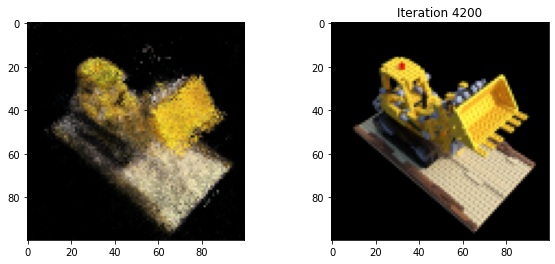

 43%|████▎     | 4300/10000 [16:07<21:39,  4.39it/s, loss=0.00546]

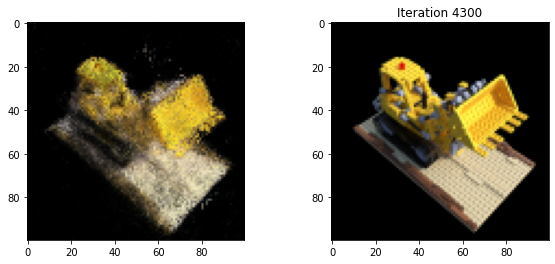

 44%|████▍     | 4400/10000 [16:30<20:48,  4.49it/s, loss=0.00428]

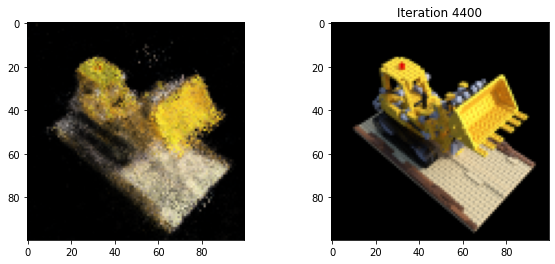

 45%|████▌     | 4500/10000 [16:53<20:38,  4.44it/s, loss=0.00241]

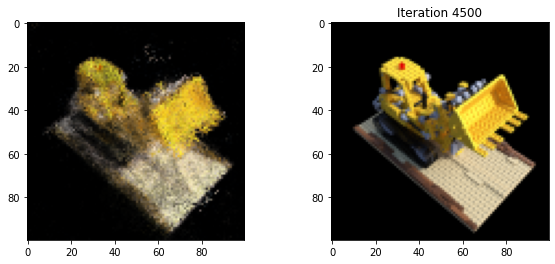

 46%|████▌     | 4600/10000 [17:16<19:44,  4.56it/s, loss=0.00413]

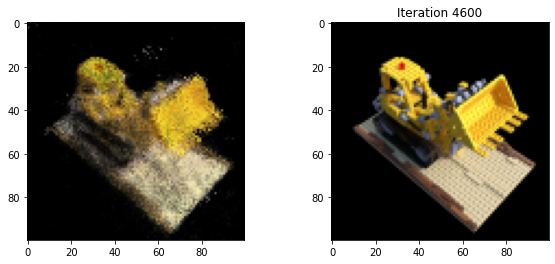

 47%|████▋     | 4700/10000 [17:39<19:49,  4.45it/s, loss=0.00523]

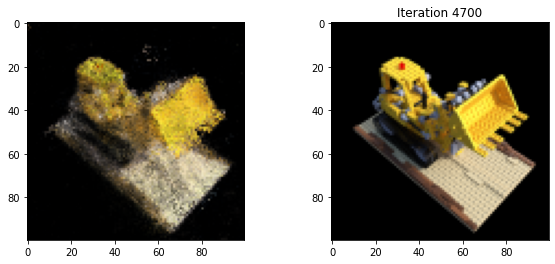

 48%|████▊     | 4800/10000 [18:02<19:25,  4.46it/s, loss=0.00301]

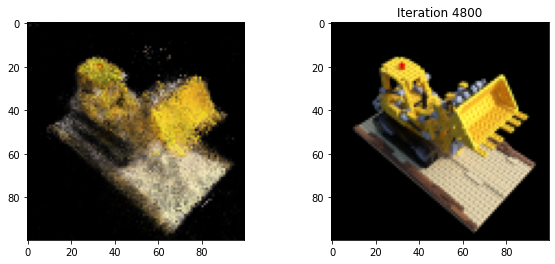

 49%|████▉     | 4900/10000 [18:25<18:46,  4.53it/s, loss=0.00574]

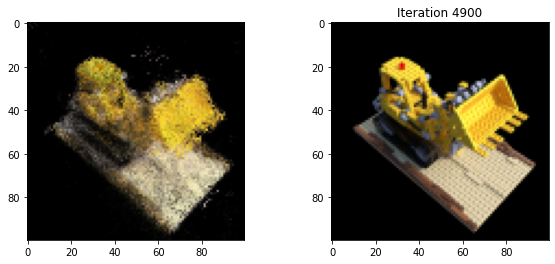

 50%|█████     | 5000/10000 [18:47<18:21,  4.54it/s, loss=0.0028] 

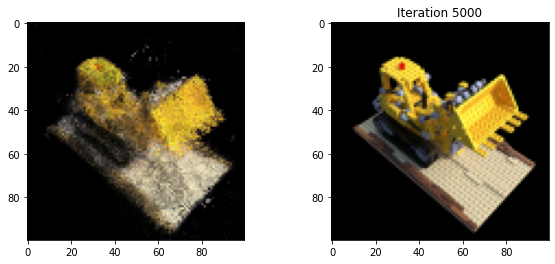

 51%|█████     | 5100/10000 [19:11<18:15,  4.47it/s, loss=0.00524]

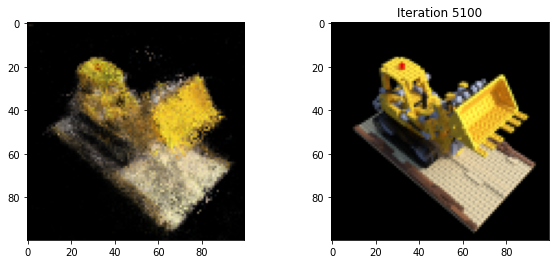

 52%|█████▏    | 5200/10000 [19:34<18:07,  4.41it/s, loss=0.00315]

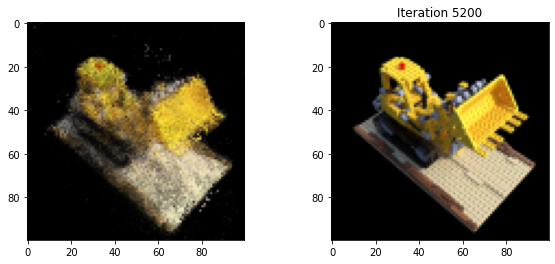

 53%|█████▎    | 5300/10000 [19:57<17:32,  4.46it/s, loss=0.00437]

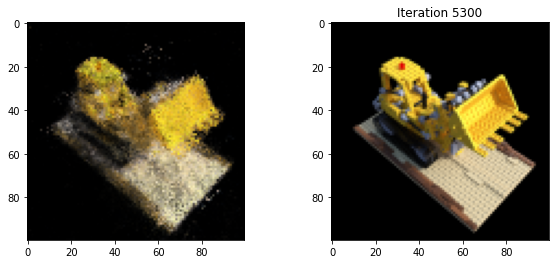

 54%|█████▍    | 5400/10000 [20:20<17:40,  4.34it/s, loss=0.00268]

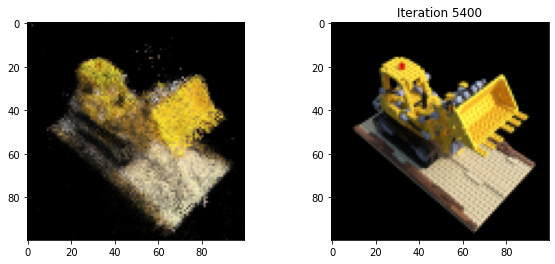

 55%|█████▌    | 5500/10000 [20:42<18:14,  4.11it/s, loss=0.00353]

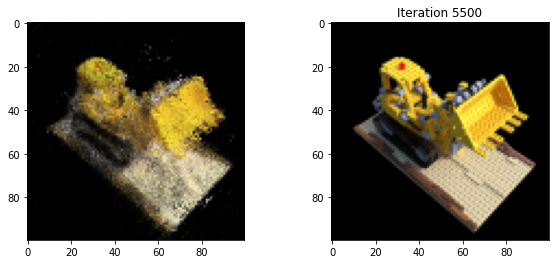

 56%|█████▌    | 5600/10000 [21:05<17:32,  4.18it/s, loss=0.00381]

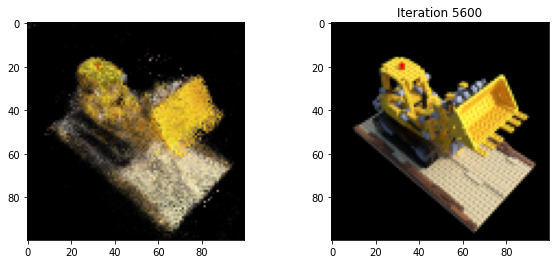

 57%|█████▋    | 5700/10000 [21:28<15:34,  4.60it/s, loss=0.00458]

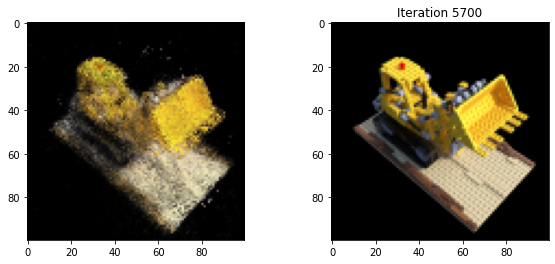

 58%|█████▊    | 5800/10000 [21:51<15:25,  4.54it/s, loss=0.00399]

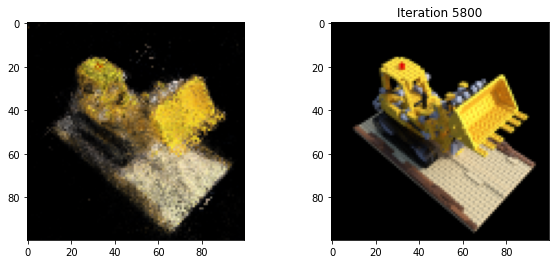

 59%|█████▉    | 5900/10000 [22:14<15:00,  4.55it/s, loss=0.00365]

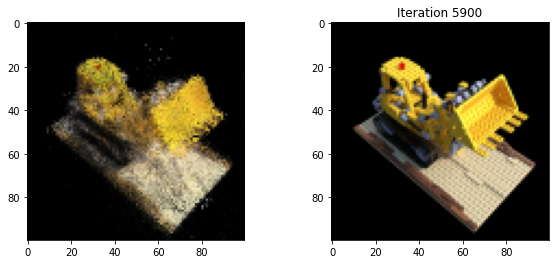

 60%|██████    | 6000/10000 [22:36<14:40,  4.54it/s, loss=0.00273]

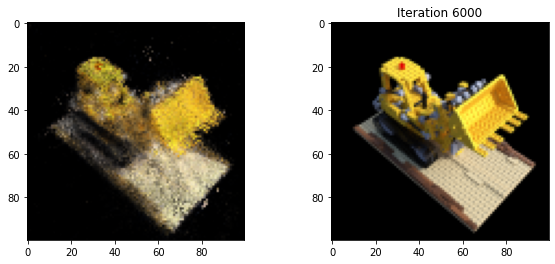

 61%|██████    | 6100/10000 [22:59<14:17,  4.55it/s, loss=0.00436]

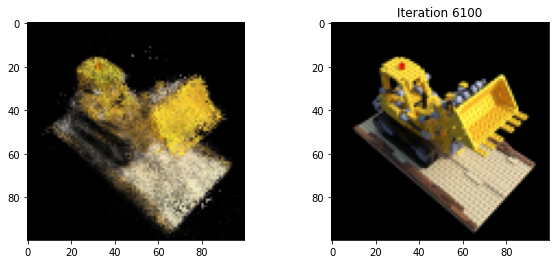

 62%|██████▏   | 6200/10000 [23:22<14:00,  4.52it/s, loss=0.0036]

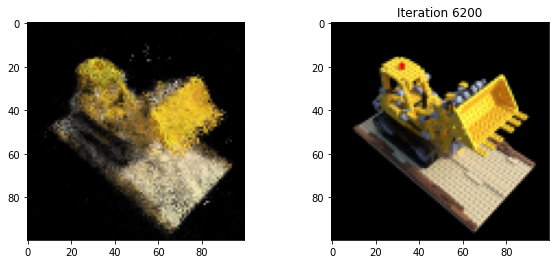

 63%|██████▎   | 6300/10000 [23:45<13:51,  4.45it/s, loss=0.00463]

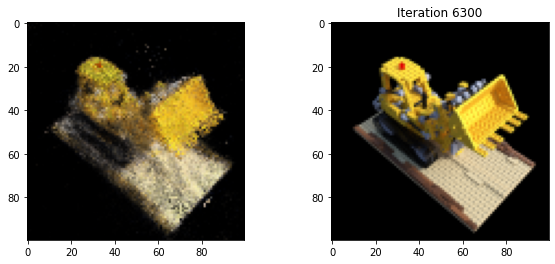

 64%|██████▍   | 6400/10000 [24:08<13:02,  4.60it/s, loss=0.00431]

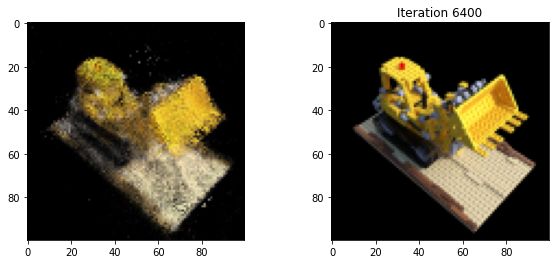

 65%|██████▌   | 6500/10000 [24:31<12:42,  4.59it/s, loss=0.00431]

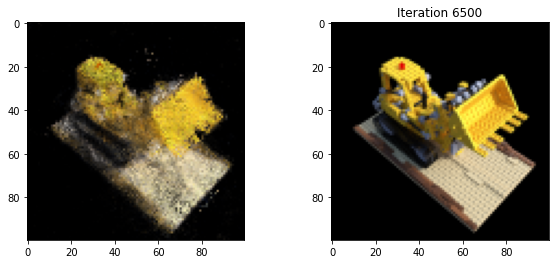

 66%|██████▌   | 6600/10000 [24:54<12:27,  4.55it/s, loss=0.00299]

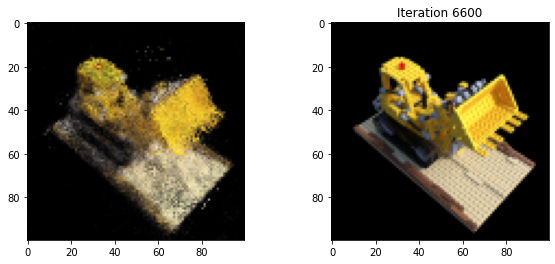

 67%|██████▋   | 6700/10000 [25:17<12:03,  4.56it/s, loss=0.00496]

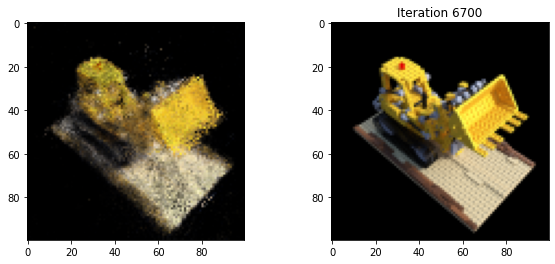

 68%|██████▊   | 6800/10000 [25:40<11:52,  4.49it/s, loss=0.00323]

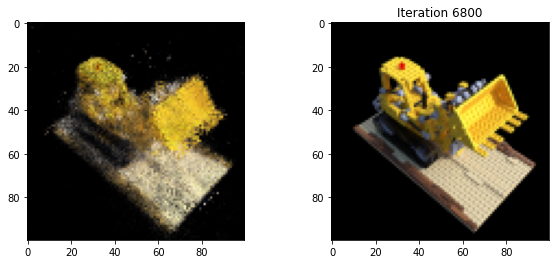

 69%|██████▉   | 6900/10000 [26:03<12:10,  4.24it/s, loss=0.00246]

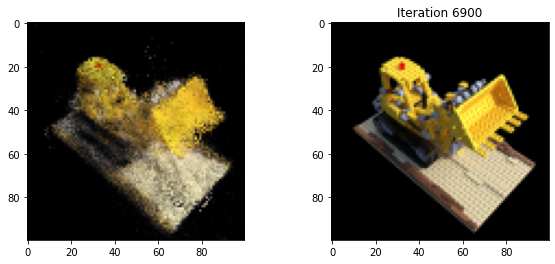

 70%|███████   | 7000/10000 [26:25<11:53,  4.21it/s, loss=0.00248]

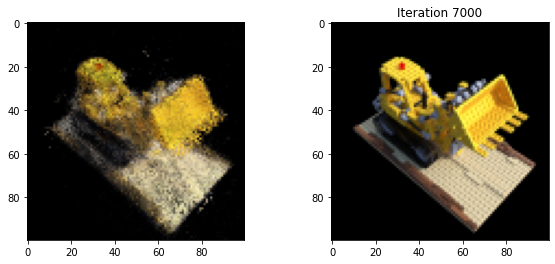

 71%|███████   | 7100/10000 [26:48<10:38,  4.54it/s, loss=0.00257]

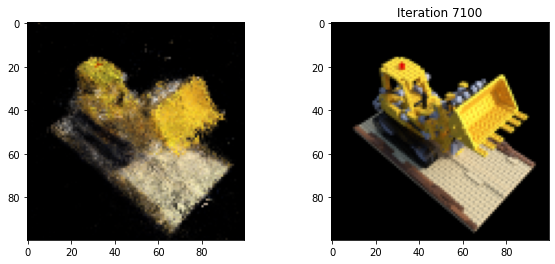

 72%|███████▏  | 7200/10000 [27:11<10:58,  4.25it/s, loss=0.00171]

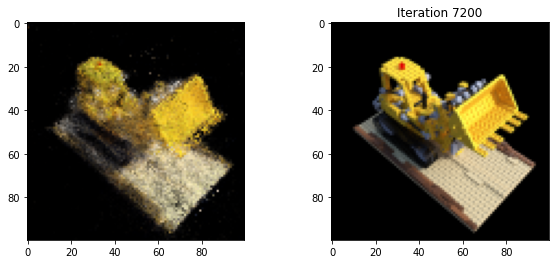

 73%|███████▎  | 7300/10000 [27:34<09:48,  4.59it/s, loss=0.00239]

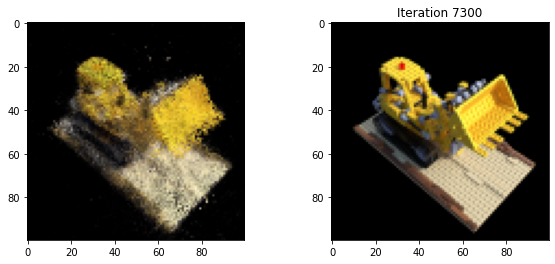

 74%|███████▍  | 7400/10000 [27:57<09:32,  4.54it/s, loss=0.00328]

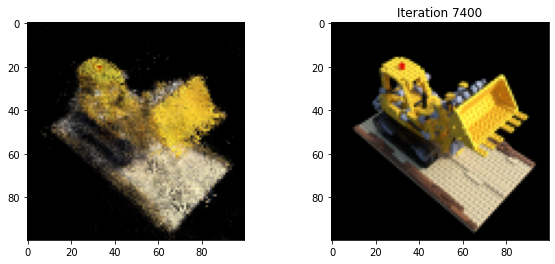

 75%|███████▌  | 7500/10000 [28:20<09:12,  4.52it/s, loss=0.00484]

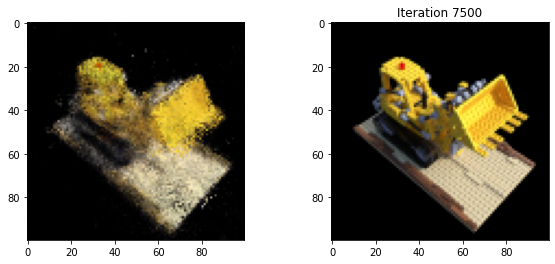

 76%|███████▌  | 7600/10000 [28:43<08:47,  4.55it/s, loss=0.00497]

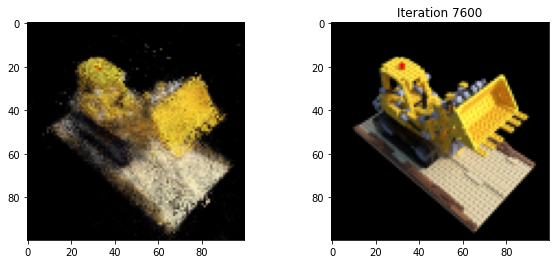

 77%|███████▋  | 7700/10000 [29:06<08:36,  4.46it/s, loss=0.00313]

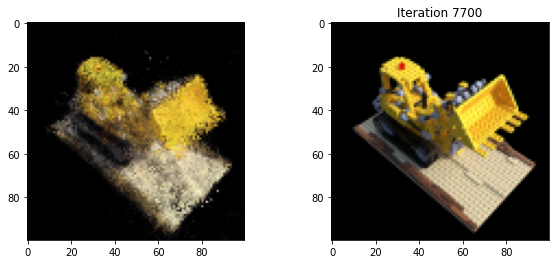

 78%|███████▊  | 7800/10000 [29:29<08:11,  4.48it/s, loss=0.00409]

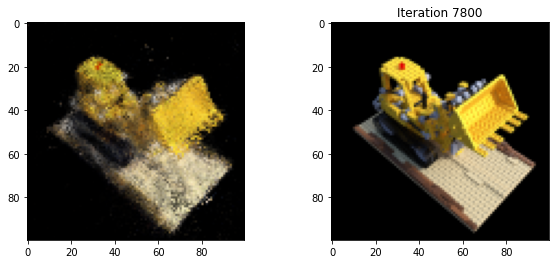

 79%|███████▉  | 7900/10000 [29:52<07:41,  4.55it/s, loss=0.0024] 

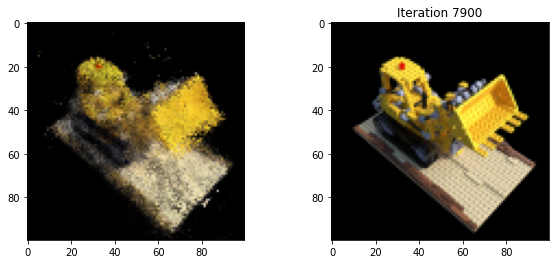

 80%|████████  | 8000/10000 [30:15<07:31,  4.43it/s, loss=0.00292]

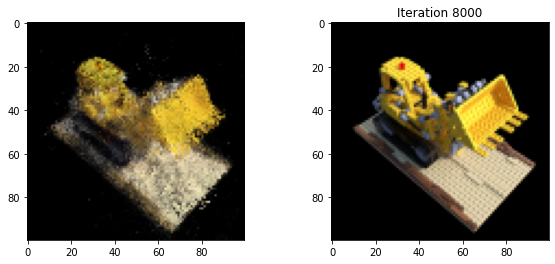

 81%|████████  | 8100/10000 [30:38<07:16,  4.35it/s, loss=0.00246]

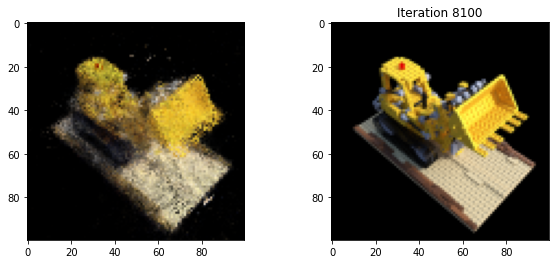

 82%|████████▏ | 8200/10000 [31:01<07:32,  3.98it/s, loss=0.00278]

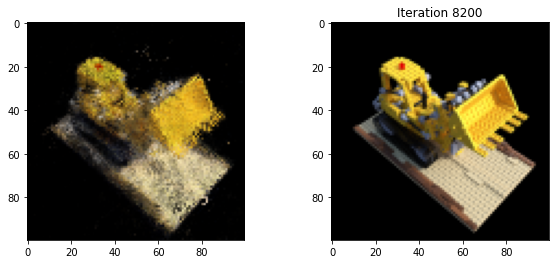

 83%|████████▎ | 8300/10000 [31:24<06:44,  4.20it/s, loss=0.00148]

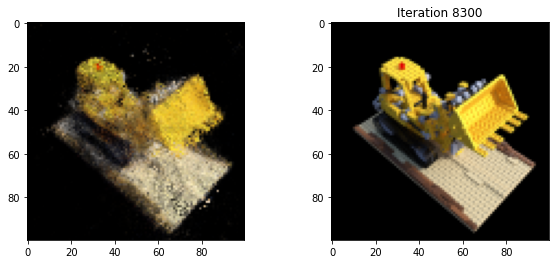

 84%|████████▍ | 8400/10000 [31:47<05:59,  4.45it/s, loss=0.00394]

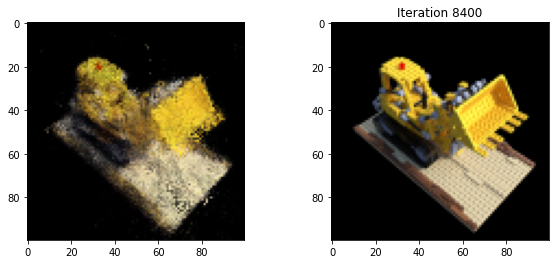

 85%|████████▌ | 8500/10000 [32:10<05:32,  4.51it/s, loss=0.00259]

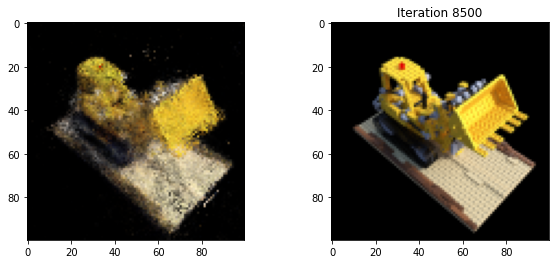

 86%|████████▌ | 8600/10000 [32:33<05:09,  4.53it/s, loss=0.0038] 

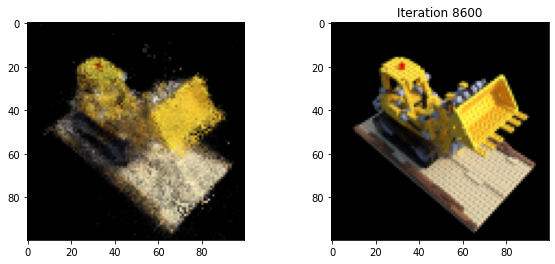

 87%|████████▋ | 8700/10000 [32:56<04:48,  4.51it/s, loss=0.00222]

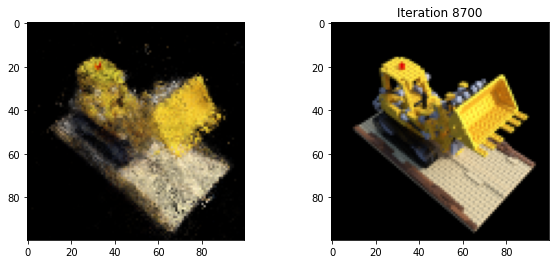

 88%|████████▊ | 8800/10000 [33:19<04:24,  4.53it/s, loss=0.00262]

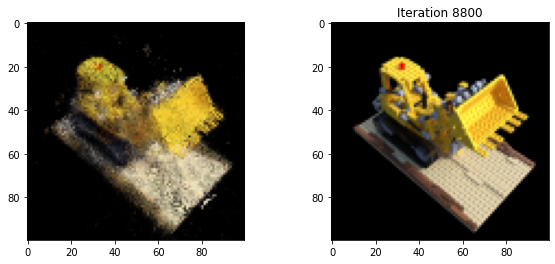

 89%|████████▉ | 8900/10000 [33:42<04:03,  4.52it/s, loss=0.00424]

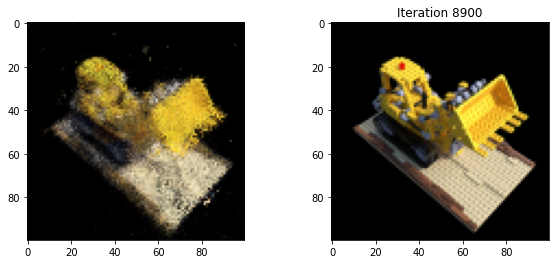

 90%|█████████ | 9000/10000 [34:05<03:40,  4.54it/s, loss=0.00212]

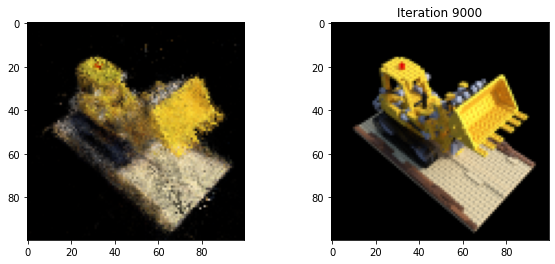

 91%|█████████ | 9100/10000 [34:28<03:18,  4.53it/s, loss=0.00226]

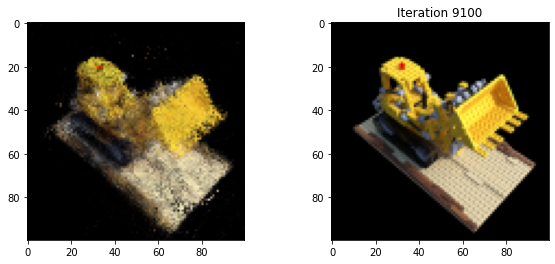

 92%|█████████▏| 9200/10000 [34:51<02:56,  4.53it/s, loss=0.00257]

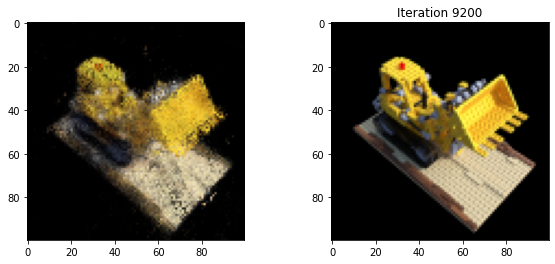

 93%|█████████▎| 9300/10000 [35:14<02:41,  4.33it/s, loss=0.00266]

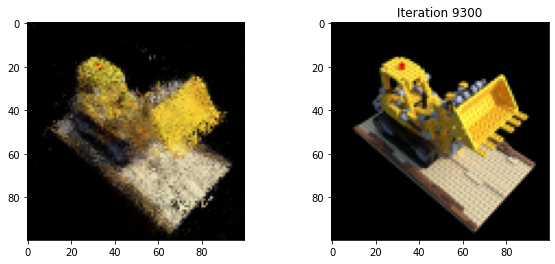

 94%|█████████▍| 9400/10000 [35:37<02:25,  4.13it/s, loss=0.00369]

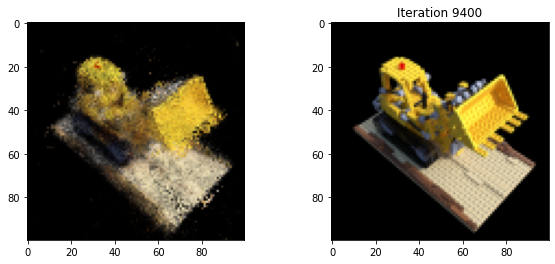

 95%|█████████▌| 9500/10000 [36:00<01:54,  4.35it/s, loss=0.00412]

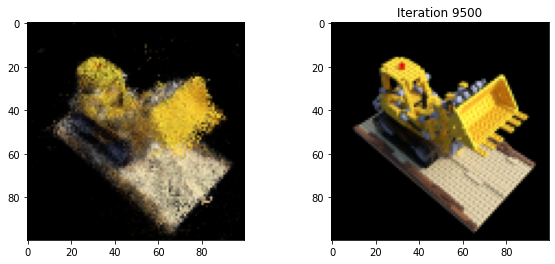

 96%|█████████▌| 9600/10000 [36:23<01:28,  4.52it/s, loss=0.00345]

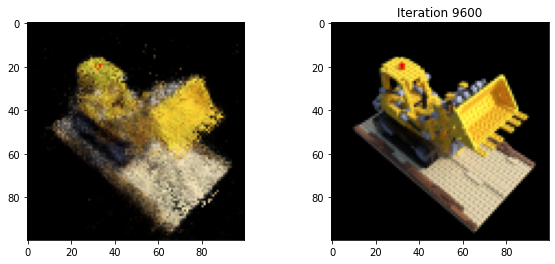

 97%|█████████▋| 9700/10000 [36:46<01:07,  4.44it/s, loss=0.00394]

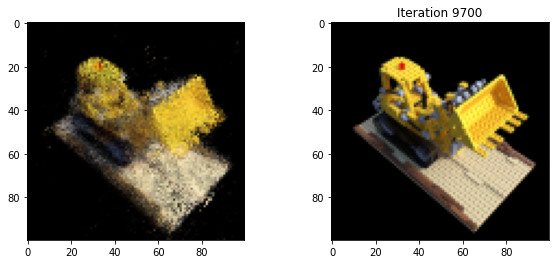

 98%|█████████▊| 9800/10000 [37:09<00:43,  4.55it/s, loss=0.00164]

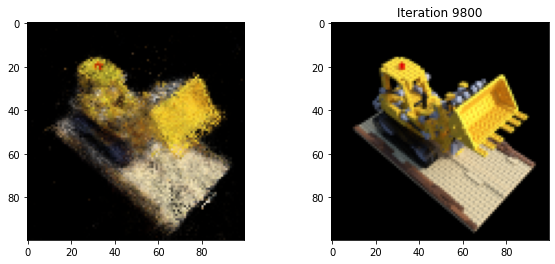

 99%|█████████▉| 9900/10000 [37:32<00:21,  4.55it/s, loss=0.00402]

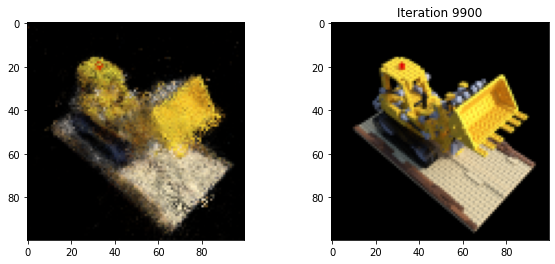

100%|██████████| 10000/10000 [37:55<00:00,  4.39it/s, loss=0.00454]


In [140]:
bounding_box = get_bbox3d(focal_length, poses, h, w, near, far)

embed_fn = HashEmbedder(bounding_box, log2_hashmap_size=log2_hashmap_size, finest_resolution=finest_res)
input_x_dim = embed_fn.out_dim

embeddir_fn = SHEncoder()
input_d_dim = embeddir_fn.out_dim

model = InstantNeRF(input_x_dim=input_x_dim, input_d_dim=input_d_dim)
model = model.to(device)

embed_fn = embed_fn.to(device)
embeddir_fn = embeddir_fn.to(device)

# model 파라미터 뿐만이 아니라 HashEmbedder 파라미터도 optimizer에 연결해 줘야 한다.
optimizer = torch.optim.Adam([{
    'params': model.parameters(), 'lr': lr  
}, {
    'params': embed_fn.parameters(), 'lr': lr
  }
], eps=1e-15)

seed = 9458
torch.manual_seed(seed)
np.random.seed(seed)

pbar = tqdm(range(num_iters))

for i in pbar:
  idx = np.random.randint(images.shape[0])
  image_i = images[idx]
  pose_i = poses[idx]

  rgb_predicted = train_step(h, w, focal_length, pose_i, near, far, N_c, embed_fn, embeddir_fn)

  loss = torch.nn.functional.mse_loss(rgb_predicted, image_i)
  loss.backward()
  optimizer.step()
  optimizer.zero_grad()

  pbar.set_postfix({"loss": loss.item()})

  if i % display_every == 0:
    rgb_predicted = train_step(h, w, focal_length, torch.from_numpy(test_pose).to(device), near, far, N_c, embed_fn, embeddir_fn)

    plt.figure(figsize=(10,4))
    plt.subplot(121)
    plt.imshow(rgb_predicted.detach().cpu().numpy())

    plt.subplot(122)
    plt.imshow(test_image)
    plt.title(f"Iteration {i}")
    plt.show()